In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# =======================
# 1. IMPORTS
# =======================

import os
import csv
import zipfile
from PIL import Image, UnidentifiedImageError
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# =======================
# 2. SET DATASET PATHS
# =======================

CONTENT_DIR = "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content"
STYLE_DIR = "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/style"
OUTPUT_DIR = "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/outputs"
CHECKPOINT_DIR = "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/checkpoints"

assert os.path.exists(CONTENT_DIR), f"Content dir not found: {CONTENT_DIR}"
assert os.path.exists(STYLE_DIR), f"Style dir not found: {STYLE_DIR}"
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

In [ ]:
# =======================
# 3. IMAGE DATASET CLASS
# =======================

class StyleContentDataset(Dataset):
    def __init__(self, content_dir, style_dir, image_size=256):
        self.content_paths = sorted([
            os.path.join(content_dir, f) for f in os.listdir(content_dir)
            if f.lower().endswith(('.jpg', '.png', '.jpeg'))
        ])
        self.style_paths = sorted([
            os.path.join(style_dir, f) for f in os.listdir(style_dir)
            if f.lower().endswith(('.jpg', '.png', '.jpeg'))
        ])
        self.transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return min(len(self.content_paths), len(self.style_paths))

    def __getitem__(self, idx):
        try:
            content = Image.open(self.content_paths[idx]).convert("RGB")
        except UnidentifiedImageError:
            print(f"[Warning] Skipping unreadable content image: {self.content_paths[idx]}")
            return self.__getitem__((idx + 1) % len(self))

        try:
            style = Image.open(self.style_paths[idx % len(self.style_paths)]).convert("RGB")
        except UnidentifiedImageError:
            print(f"[Warning] Skipping unreadable style image: {self.style_paths[idx % len(self.style_paths)]}")
            return self.__getitem__((idx + 1) % len(self))

        return self.transform(content), self.transform(style)

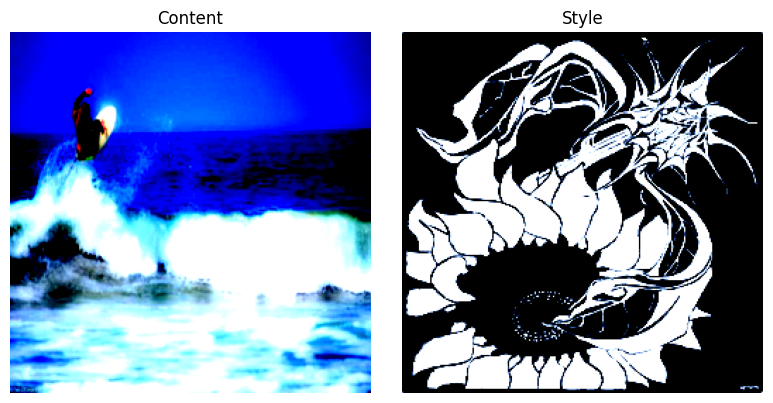

In [ ]:
dataset = StyleContentDataset(CONTENT_DIR, STYLE_DIR, image_size=256)

# Display one content-style pair
def show_sample(idx=0):
    content, style = dataset[idx]

    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(content.permute(1, 2, 0).numpy())
    axs[0].set_title("Content")
    axs[0].axis("off")

    axs[1].imshow(style.permute(1, 2, 0).numpy())
    axs[1].set_title("Style")
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()

show_sample(0)

In [ ]:
# =======================
# 4. UTILS
# =======================

def mean_std(x):
    B, C, H, W = x.shape
    mean = x.view(B, C, -1).mean(2).view(B, C, 1, 1)
    std = x.view(B, C, -1).std(2).view(B, C, 1, 1) + 1e-5
    return mean, std

def adain(content_feat, style_feat):
    c_mean, c_std = mean_std(content_feat)
    s_mean, s_std = mean_std(style_feat)
    return s_std * (content_feat - c_mean) / c_std + s_mean

def adjust_learning_rate(optimizer, iteration_count, base_lr=1e-4, lr_decay=5e-5):
    lr = base_lr / (1.0 + lr_decay * iteration_count)
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

vgg_denorm = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

def deprocess(tensor):
    tensor = tensor.cpu().clone().detach().squeeze(0)
    tensor = vgg_denorm(tensor).clamp(0, 1)
    return transforms.ToPILImage()(tensor)

In [ ]:
# =======================
# 5. VGG ENCODER & LOSS
# =======================

class VGGEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg19(pretrained=True).features
        self.enc = nn.Sequential(*list(vgg.children())[:21])
        for param in self.parameters():
            param.requires_grad = False

    def forward(self, x):
        return self.enc(x)

class VGG_Loss(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg19(pretrained=True).features
        self.blocks = nn.ModuleList([
            nn.Sequential(*list(vgg.children())[:4]),   # relu1_1
            nn.Sequential(*list(vgg.children())[:11]),  # relu2_1
            nn.Sequential(*list(vgg.children())[:18]),  # relu3_1
            nn.Sequential(*list(vgg.children())[:21])   # relu4_1
        ])
        for p in self.parameters():
            p.requires_grad = False

    def forward(self, x):
        features = []
        # Apply each block to the original input image x
        features.append(self.blocks[0](x)) # relu1_1 features
        features.append(self.blocks[1](x)) # relu2_1 features
        features.append(self.blocks[2](x)) # relu3_1 features
        features.append(self.blocks[3](x)) # relu4_1 features
        return features

def style_loss(gen_feats, style_feats):
    loss = 0
    for g, s in zip(gen_feats, style_feats):
        gm, gs = mean_std(g)
        sm, ss = mean_std(s)
        loss += F.mse_loss(gm, sm) + F.mse_loss(gs, ss)
    return loss

def total_variation_loss(img):
    return torch.sum(torch.abs(img[:, :, :, :-1] - img[:, :, :, 1:])) + \
           torch.sum(torch.abs(img[:, :, :-1, :] - img[:, :, 1:, :]))

In [ ]:
# =======================
# 6. DECODER
# =======================

class Decoder(nn.Module):
     def __init__(self):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(512, 256, 3),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='nearest'),

            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 128, 3),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='nearest'),

            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 128, 3),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 64, 3),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2, mode='nearest'),

            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 64, 3),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 3, 3)  # Final image output
        )

     def forward(self, x):
        return self.decoder(x)

In [ ]:
print("CUDA available:", torch.cuda.is_available())
print("Device:", torch.cuda.get_device_name(0))

CUDA available: True
Device: NVIDIA A100-SXM4-40GB


In [ ]:
from collections import namedtuple

# Define experiment configuration format
RunConfig = namedtuple("RunConfig", ["run_id", "cw", "sw", "optimizer"])

# Define experiments
experiments = [
    # Adam optimizer
    RunConfig("A", 1.0, 1e1, "adam"),
    RunConfig("B", 1.0, 5e1, "adam"),
    RunConfig("C", 1.0, 1e2, "adam"),
    RunConfig("D", 5.0, 1e1, "adam"),
    RunConfig("E", 5.0, 5e1, "adam"),
    RunConfig("F", 5.0, 1e2, "adam"),

    # RMSprop optimizer
    RunConfig("G", 1.0, 1e1, "rmsprop"),
    RunConfig("H", 1.0, 5e1, "rmsprop"),
    RunConfig("I", 1.0, 1e2, "rmsprop"),
    RunConfig("J", 5.0, 1e1, "rmsprop"),
    RunConfig("K", 5.0, 5e1, "rmsprop"),
    RunConfig("L", 5.0, 1e2, "rmsprop"),
]

In [ ]:
def train_adain_experiments(run,
    num_epochs=5,
    batch_size=16,
    lr=1e-4,
    lr_decay=5e-5,
    alpha=1.0,
    tv_weight=1e-6,
    checkpoint_base="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/checkpoints",
    model_base="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models",
    sample_output_base="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_outputs",
    log_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/experiment_results.csv"
):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"\n===== Running Experiment {run.run_id} =====")

    # Setup model
    encoder = VGGEncoder().to(device).eval()
    decoder = Decoder().to(device)
    loss_net = VGG_Loss().to(device).eval()

    # Setup optimizer
    if run.optimizer.lower() == "adam":
        optimizer = torch.optim.Adam(decoder.parameters(), lr=lr)
    elif run.optimizer.lower() == "rmsprop":
        optimizer = torch.optim.RMSprop(decoder.parameters(), lr=lr)
    else:
        raise ValueError(f"Unsupported optimizer: {run.optimizer}")

    start_epoch = 0
    iteration = 0
    content_losses, style_losses, total_losses = [], [], []

    # Paths
    run_checkpoint = os.path.join(checkpoint_base, f"adain_checkpoint_hyp_{run.run_id}.pth")
    run_model_path = os.path.join(model_base, f"adain_model_hyp_c{run.cw}_s{run.sw}_{run.optimizer}.pth")
    sample_output_dir = os.path.join(sample_output_base, f"run_{run.run_id}")
    os.makedirs(sample_output_dir, exist_ok=True)

    # Resume from checkpoint if exists
    if os.path.exists(run_checkpoint):
        checkpoint = torch.load(run_checkpoint, map_location=device)
        if checkpoint.get("finished"):
            print(f"[{run.run_id}] Already completed. Skipping.")
            return
        decoder.load_state_dict(checkpoint["decoder_state_dict"])
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
        start_epoch = checkpoint["epoch"]
        iteration = checkpoint["iteration"]
        print(f"[{run.run_id}] Resumed from epoch {start_epoch+1}, iteration {iteration}")

    # Load dataset
    dataset = StyleContentDataset(CONTENT_DIR, STYLE_DIR)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True, prefetch_factor=2)

    # Training loop
    for epoch in range(start_epoch, num_epochs):
        for i, (content, style) in enumerate(tqdm(loader, desc=f"Run {run.run_id} | Epoch {epoch+1}")):
            content, style = content.to(device), style.to(device)
            adjust_learning_rate(optimizer, iteration, base_lr=lr, lr_decay=lr_decay)
            iteration += 1

            # AdaIN feature alignment
            with torch.no_grad():
                c_feat = encoder(content)
                s_feat = encoder(style)
                t = adain(c_feat, s_feat)
                t = alpha * t + (1 - alpha) * c_feat

            output = decoder(t)
            out_feat = encoder(output)

            # Compute losses
            c_loss = F.mse_loss(out_feat, t)
            s_loss = style_loss(loss_net(output), loss_net(style))
            tv_loss = total_variation_loss(output)
            loss = run.cw * c_loss + run.sw * s_loss + tv_weight * tv_loss

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Save first sample every 300 iterations
            if iteration % 300 == 0:
                sample = output[0].detach().cpu()
                sample = vgg_denorm(sample).clamp(0, 1)
                save_path = os.path.join(sample_output_dir, f"epoch{epoch+1}_iter{iteration}.jpg")
                vutils.save_image(sample, save_path)
                print(f"[{run.run_id}] Saved sample: {save_path}")

            # Save checkpoint
            if iteration % 500 == 0:
                torch.save({
                    "epoch": epoch,
                    "iteration": iteration,
                    "decoder_state_dict": decoder.state_dict(),
                    "optimizer_state_dict": optimizer.state_dict(),
                    "finished": False
                }, run_checkpoint)

            # Track loss for logging
            content_losses.append(c_loss.item())
            style_losses.append(s_loss.item())
            total_losses.append(loss.item())

    # Save final model
    torch.save(decoder.state_dict(), run_model_path)
    print(f"[{run.run_id}] Model saved to: {run_model_path}")

    # Mark checkpoint as complete
    torch.save({
        "epoch": num_epochs,
        "iteration": iteration,
        "decoder_state_dict": decoder.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "finished": True
    }, run_checkpoint)

    # Append to CSV log
    if not os.path.exists(log_path) or os.stat(log_path).st_size == 0:
        with open(log_path, mode='w', newline='') as f:
            writer = csv.writer(f)
            writer.writerow(["run_id", "cw", "sw", "optimizer", "final_content_loss", "final_style_loss", "final_total_loss", "model_path"])

    with open(log_path, mode='a', newline='') as f:
        writer = csv.writer(f)
        writer.writerow([
            run.run_id, run.cw, run.sw, run.optimizer,
            round(content_losses[-1], 4),
            round(style_losses[-1], 4),
            round(total_losses[-1], 4),
            run_model_path
        ])

In [ ]:
def run_adain_experiments():
    for run in experiments:
        train_adain_experiments(run)

In [ ]:
run_adain_experiments()

In [ ]:
adain_model_runs = [
    ("A", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s10.0_adam.pth"),
    ("B", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s50.0_adam.pth"),
    ("C", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s100.0_adam.pth"),
    ("D", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s10.0_adam.pth"),
    ("E", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s50.0_adam.pth"),
    ("F", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s100.0_adam.pth"),
    ("G", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s10.0_rmsprop.pth"),
    ("H", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s50.0_rmsprop.pth"),
    ("I", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s100.0_rmsprop.pth"),
    ("J", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s10.0_rmsprop.pth"),
    ("K", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s50.0_rmsprop.pth"),
    ("L", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s100.0_rmsprop.pth")
]

In [ ]:
def stylize_adain_experiments(model_runs,
                              alpha,
                              content_image_path,
                              style_image_path,
                              device="cuda"):
    import time
    from torchvision import transforms
    from PIL import Image
    import matplotlib.pyplot as plt
    import torch

    # Image Transforms
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
    transform_display = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor()
    ])
    to_pil = transforms.ToPILImage()

    # Load content/style
    content_img = Image.open(content_image_path).convert("RGB")
    style_img = Image.open(style_image_path).convert("RGB")

    content_tensor = transform(content_img).unsqueeze(0).to(device)
    style_tensor = transform(style_img).unsqueeze(0).to(device)
    content_display = to_pil(transform_display(content_img))
    style_display = to_pil(transform_display(style_img))

    # Setup encoder
    encoder = VGGEncoder().to(device).eval()

    # Run through each model
    for run_id, model_path in model_runs:
        print(f"\nRun {run_id} — Loading model from: {model_path}")
        start = time.time()

        decoder = Decoder().to(device)
        decoder.load_state_dict(torch.load(model_path, map_location=device))
        decoder.eval()

        # AdaIN alignment
        with torch.no_grad():
            c_feat = encoder(content_tensor)
            s_feat = encoder(style_tensor)

            c_mean, c_std = c_feat.mean([2, 3], keepdim=True), c_feat.std([2, 3], keepdim=True)
            s_mean, s_std = s_feat.mean([2, 3], keepdim=True), s_feat.std([2, 3], keepdim=True)
            t = s_std * (c_feat - c_mean) / c_std + s_mean
            t = alpha * t + (1.0 - alpha) * c_feat

            stylized = decoder(t)

        # Denormalize and display
        vgg_denorm = transforms.Normalize(
            mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
            std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
        )
        stylized_img = vgg_denorm(stylized[0].cpu()).clamp(0, 1)
        stylized_pil = to_pil(stylized_img)

        end = time.time()
        print(f"Stylization time: {round(end - start, 2)}s")

        # Side-by-side visualization
        fig, axs = plt.subplots(1, 3, figsize=(12, 4))
        axs[0].imshow(content_display)
        axs[0].set_title("Content")
        axs[0].axis("off")

        axs[1].imshow(style_display)
        axs[1].set_title("Style")
        axs[1].axis("off")

        axs[2].imshow(stylized_pil)
        axs[2].set_title(f"Stylized (Run {run_id})")
        axs[2].axis("off")

        plt.tight_layout()
        plt.show()


Run A — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s10.0_adam.pth
Stylization time: 0.06s


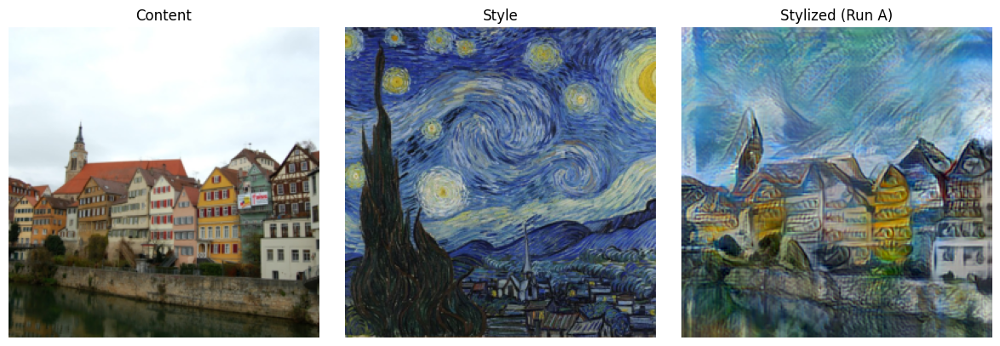


Run B — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s50.0_adam.pth
Stylization time: 0.06s


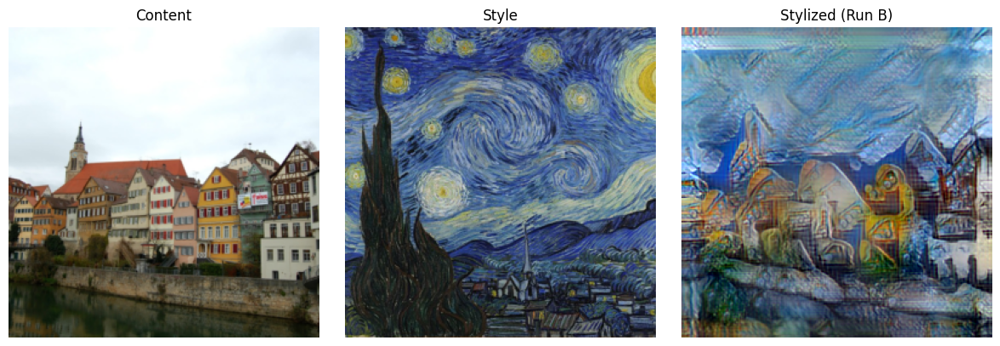


Run C — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s100.0_adam.pth
Stylization time: 0.06s


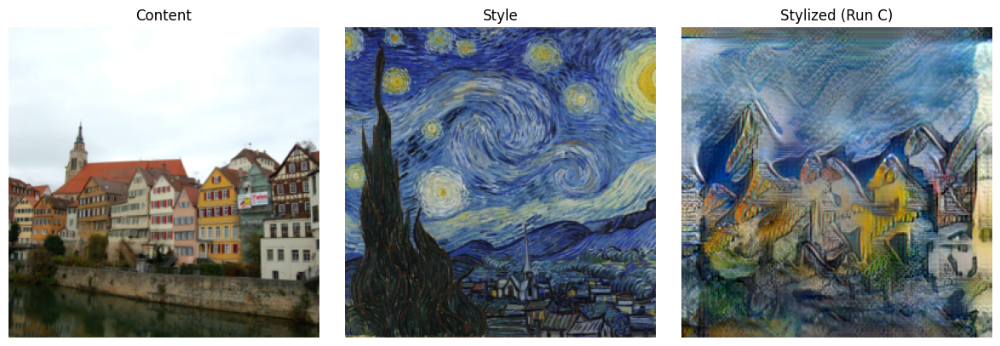


Run D — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s10.0_adam.pth
Stylization time: 0.06s


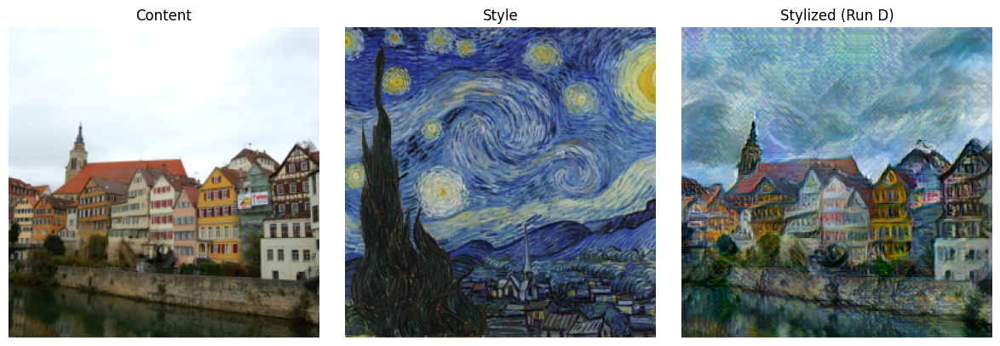


Run E — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s50.0_adam.pth
Stylization time: 0.06s


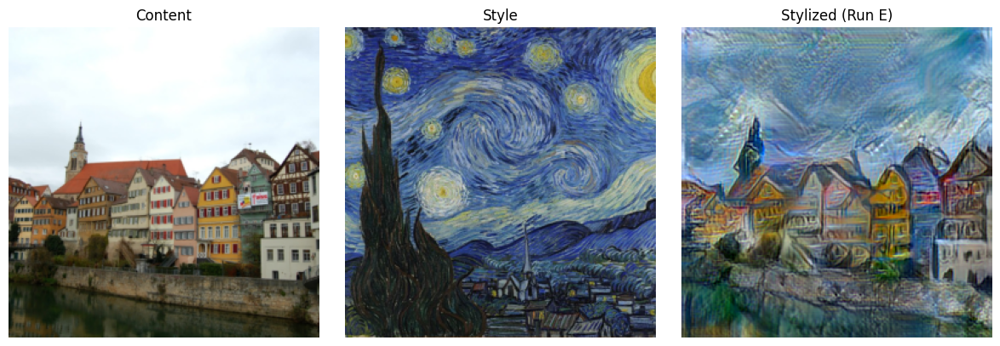


Run F — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s100.0_adam.pth
Stylization time: 0.06s


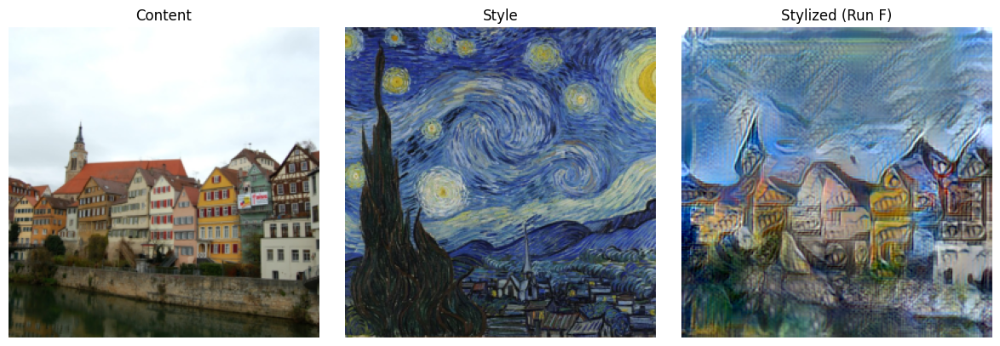


Run G — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s10.0_rmsprop.pth
Stylization time: 0.06s


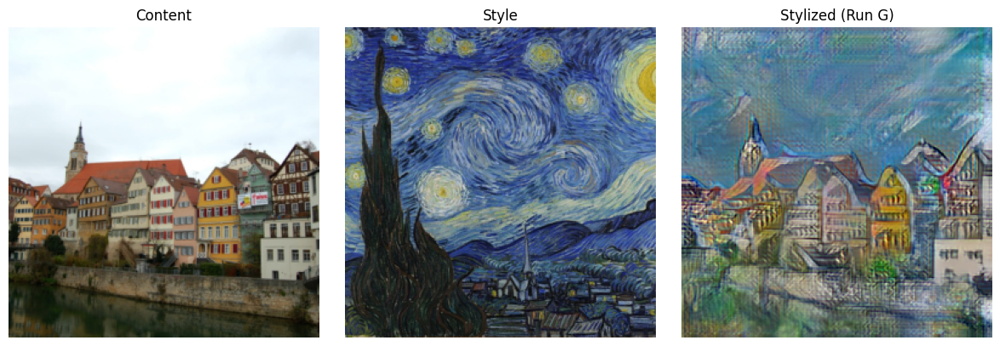


Run H — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s50.0_rmsprop.pth
Stylization time: 0.06s


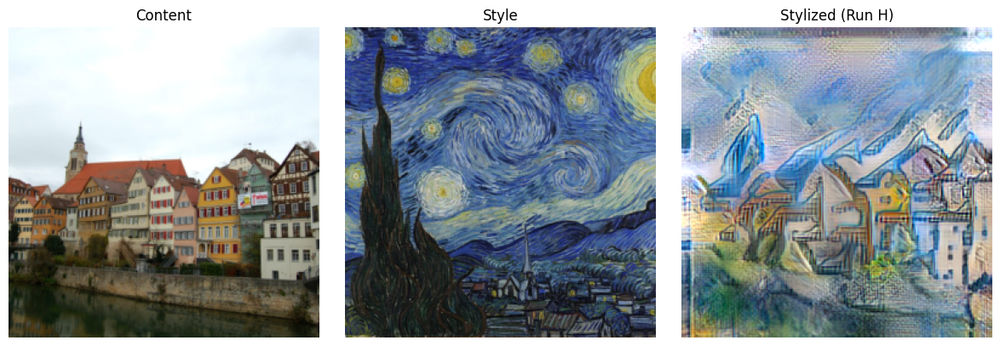


Run I — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c1.0_s100.0_rmsprop.pth
Stylization time: 0.24s


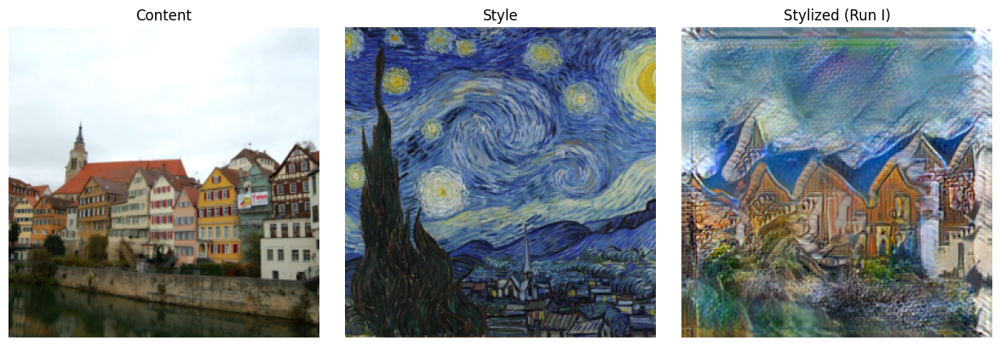


Run J — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s10.0_rmsprop.pth
Stylization time: 0.05s


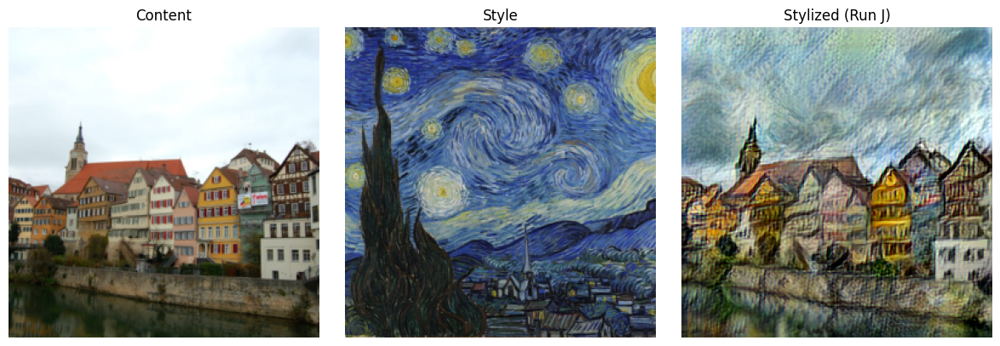


Run K — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s50.0_rmsprop.pth
Stylization time: 0.06s


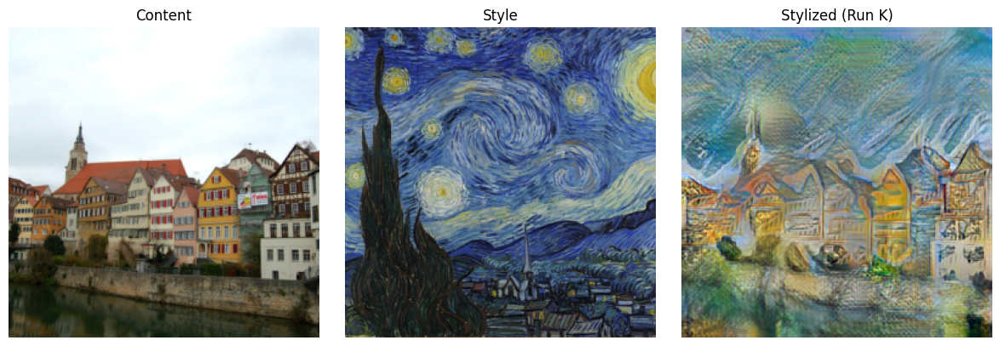


Run L — Loading model from: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/hparams_models/adain_model_hyp_c5.0_s100.0_rmsprop.pth
Stylization time: 0.06s


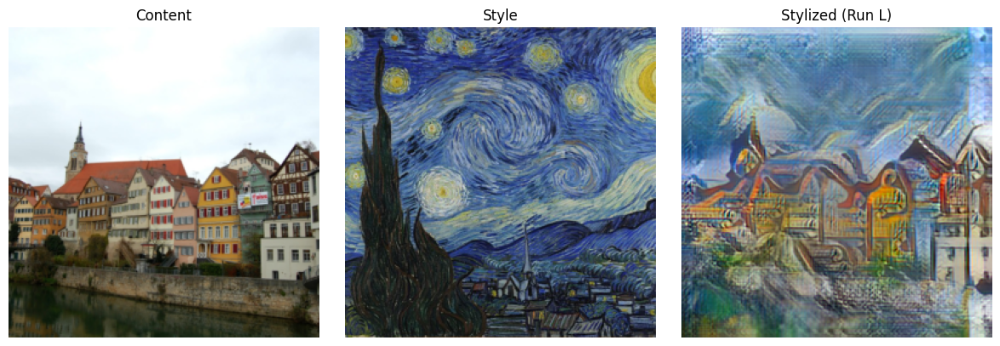

In [ ]:
stylize_adain_experiments(
    model_runs=adain_model_runs,
    alpha = 0.8,
    content_image_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/houses_content.jpg",
    style_image_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/MSPM/style/Starry_Night.jpg"
)

In [ ]:
def stylize_adain_image(content_path, style_path, decoder_path,
                        alpha=1.0, image_size=256, output_path=None):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load models
    encoder = VGGEncoder().to(device).eval()
    decoder = Decoder().to(device)
    decoder.load_state_dict(torch.load(decoder_path, map_location=device))
    decoder.eval()

    # Image transforms
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
    transform_display = transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor()
    ])

    def load_image(path, display=False):
        img = Image.open(path).convert("RGB")
        return (transform_display if display else transform)(img).unsqueeze(0).to(device)

    content = load_image(content_path)
    style = load_image(style_path)
    content_disp = load_image(content_path, display=True).squeeze(0).cpu()
    style_disp = load_image(style_path, display=True).squeeze(0).cpu()

    # AdaIN alignment
    def adain(c_feat, s_feat, eps=1e-5):
        c_mean, c_std = c_feat.mean([2, 3], keepdim=True), c_feat.std([2, 3], keepdim=True)
        s_mean, s_std = s_feat.mean([2, 3], keepdim=True), s_feat.std([2, 3], keepdim=True)
        return (c_feat - c_mean) / (c_std + eps) * s_std + s_mean

    def vgg_denorm(tensor):
        mean = torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1).to(device)
        std = torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1).to(device)
        return tensor * std + mean

    # Stylize
    with torch.no_grad():
        c_feat = encoder(content)
        s_feat = encoder(style)
        t = adain(c_feat, s_feat)
        t = alpha * t + (1 - alpha) * c_feat
        output = decoder(t)
        output = vgg_denorm(output).clamp(0, 1).cpu().squeeze(0)

    # Save result
    if output_path:
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        vutils.save_image(output, output_path)
        print(f"Stylized image saved to: {output_path}")

    # Side-by-side visualization
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(content_disp.permute(1, 2, 0))
    axs[0].set_title("Content")
    axs[1].imshow(style_disp.permute(1, 2, 0))
    axs[1].set_title("Style")
    axs[2].imshow(output.permute(1, 2, 0))
    axs[2].set_title("Stylized")
    for ax in axs: ax.axis("off")
    plt.tight_layout()
    plt.show()

Stylized image saved to: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/outputs/stylized_houses_StarryNight.jpg


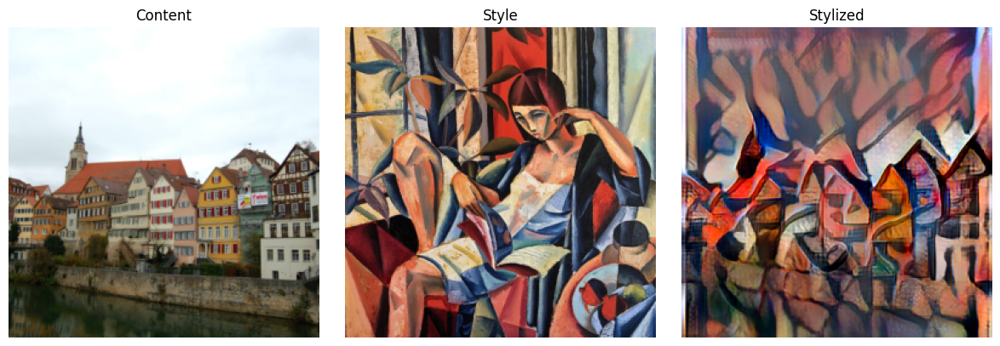

In [ ]:
stylize_adain_image(
    content_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/houses_content.jpg",
    style_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/test_styles/The_Visitor_by_Hennie_Niemann.jpg",
    decoder_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/decoder_epoch5.pth",
    output_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/outputs/stylized_houses_StarryNight.jpg",
    alpha=1.0
)